<a href="https://colab.research.google.com/github/diego51alejo/Crime_Prediction/blob/master/Delitos_Bucaramanga.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install --upgrade pandas

     |████████████████████████████████| 11.3 MB 2.0 MB/s 
  Attempting uninstall: pandas
    Found existing installation: pandas 1.1.5
    Uninstalling pandas-1.1.5:
      Successfully uninstalled pandas-1.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas~=1.1.0; python_version >= "3.0", but you have pandas 1.3.5 which is incompatible.


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
%cd '/content/drive/My Drive/Colab Notebooks/db'

Mounted at /content/drive/
/content/drive/My Drive/Colab Notebooks/db


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df_del = pd.read_csv('Delitos_en_Bucaramanga.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (3,4) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
df_del.head(3)

,ORDEN,ARMAS_MEDIOS,BARRIOS_HECHO,LATITUD,LONGITUD,ZONA,NOM_COMUNA,ANO,MES,DIA,DIA_SEMANA,DESCRIPCION_CONDUCTA,CONDUCTA,CLASIFICACIONES DELITO,EDAD,CURSO_DE_VIDA,ESTADO_CIVIL_PERSONA,GENERO,MOVIL_AGRESOR,MOVIL_VICTIMA
0,1,ARMA BLANCA / CORTOPUNZANTE,BUENOS AIRES,7.170557,-73.135108,URBANA,14. Morrorico,2010,01. Enero,1,05. Viernes,ARTÍCULO 111. LESIONES PERSONALES,LESIONES PERSONALES,Lesiones no fatales,30,05. Adultez,UNION LIBRE,MASCULINO,A PIE,A PIE
1,2,ARMA BLANCA / CORTOPUNZANTE,CAMPO HERMOSO,7.120645,-73.12605,URBANA,05. García Rovira,2010,01. Enero,1,05. Viernes,ARTÍCULO 111. LESIONES PERSONALES,LESIONES PERSONALES,Lesiones no fatales,21,04. Jovenes,SOLTERO,MASCULINO,A PIE,A PIE
2,3,ARMA BLANCA / CORTOPUNZANTE,CAMPO HERMOSO,7.120645,-73.12605,URBANA,05. García Rovira,2010,01. Enero,1,05. Viernes,ARTÍCULO 111. LESIONES PERSONALES,LESIONES PERSONALES,Lesiones no fatales,23,04. Jovenes,SOLTERO,MASCULINO,A PIE,A PIE


In [ ]:
df_del.describe(include='all')

,ORDEN,ARMAS_MEDIOS,BARRIOS_HECHO,LATITUD,LONGITUD,ZONA,NOM_COMUNA,ANO,MES,DIA,DIA_SEMANA,DESCRIPCION_CONDUCTA,CONDUCTA,CLASIFICACIONES DELITO,EDAD,CURSO_DE_VIDA,ESTADO_CIVIL_PERSONA,GENERO,MOVIL_AGRESOR,MOVIL_VICTIMA
count,260083.000000,260083,260083,251831.000000,251831,260083,260083,260083.000000,260083,260083.000000,260083,260083,259185,260083,260083,260083,260083,260083,260083,260083
unique,NaN,43,467,123795.000000,111328,3,26,NaN,20,NaN,13,45,123,4,101,13,10,4,14,14
top,NaN,CONTUNDENTES,CENTRO,7.178046,"-7,313,022,442",URBANA,03. San Francisco,NaN,12. Diciembre,NaN,06. Sábado,ARTÍCULO 239. HURTO A PERSONAS,HURTO A PERSONAS,Lesiones no fatales,NO REPORTA,05. Adultez,SOLTERO,MASCULINO,A PIE,A PIE
freq,NaN,72766,21445,1799.000000,1799,257483,30592,NaN,22488,NaN,40300,86562,78314,247928,17320,121471,122450,125137,179483,201855
mean,64946.746819,NaN,NaN,NaN,NaN,NaN,NaN,2015.520672,NaN,15.463994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,37422.973800,NaN,NaN,NaN,NaN,NaN,NaN,3.240531,NaN,8.818625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,2010.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,32511.000000,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,65021.000000,NaN,NaN,NaN,NaN,NaN,NaN,2016.000000,NaN,15.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,97531.500000,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,23.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Limpieza de Datos

In [ ]:
df_copy = df_del.copy(deep=True)

In [ ]:
list(df_copy)

['ORDEN',
 'ARMAS_MEDIOS',
 'BARRIOS_HECHO',
 'LATITUD',
 'LONGITUD',
 'ZONA',
 'NOM_COMUNA',
 'ANO',
 'MES',
 'DIA',
 'DIA_SEMANA',
 'DESCRIPCION_CONDUCTA',
 'CONDUCTA',
 'CLASIFICACIONES DELITO',
 'EDAD',
 'CURSO_DE_VIDA',
 'ESTADO_CIVIL_PERSONA',
 'GENERO',
 'MOVIL_AGRESOR',
 'MOVIL_VICTIMA']

In [ ]:
df_copy = df_copy.loc[:,[
 'LATITUD',
 'LONGITUD',
 'NOM_COMUNA',
 'ANO',
 'MES',
 'DIA',
 'DIA_SEMANA',
 'CONDUCTA',
 'CURSO_DE_VIDA',
 'GENERO',
]]
df_copy

,LATITUD,LONGITUD,NOM_COMUNA,ANO,MES,DIA,DIA_SEMANA,CONDUCTA,CURSO_DE_VIDA,GENERO
0,7.170557,-73.135108,14. Morrorico,2010,01. Enero,1,05. Viernes,LESIONES PERSONALES,05. Adultez,MASCULINO
1,7.120645,-73.12605,05. García Rovira,2010,01. Enero,1,05. Viernes,LESIONES PERSONALES,04. Jovenes,MASCULINO
2,7.120645,-73.12605,05. García Rovira,2010,01. Enero,1,05. Viernes,LESIONES PERSONALES,04. Jovenes,MASCULINO
3,7.151359,-73.145705,03. San Francisco,2010,01. Enero,1,05. Viernes,LESIONES PERSONALES,05. Adultez,MASCULINO
4,7.170557,-73.135108,04. Occidental,2010,01. Enero,1,05. Viernes,LESIONES PERSONALES,04. Jovenes,MASCULINO
...,...,...,...,...,...,...,...,...,...,...
260078,7.098447531,-73.10746901,16. Lagos del Cacique,2021,07. julio,22,04. Jueves,MECHERO/HORMIGUEO,00. No Reporta,NO REPORTA
260079,7.129577142,-73.1246566,03. San Francisco,2021,07. julio,27,02. Martes,MECHERO/HORMIGUEO,00. No Reporta,NO REPORTA
260080,7.12344346,-73.11691678,13. Oriental,2021,07. julio,28,03. Miércoles,SUPL. SERVICIOS TECNICOS,00. No Reporta,NO REPORTA
260081,7.134729719,-73.10952894,13. Oriental,2021,07. julio,9,05. Viernes,HALADO,05. Adultez,MASCULINO


In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260083 entries, 0 to 260082
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   LATITUD               251831 non-null  object
 1   LONGITUD              251831 non-null  object
 2   NOM_COMUNA            260083 non-null  object
 3   ANO                   260083 non-null  int64 
 4   MES                   260083 non-null  object
 5   DIA                   260083 non-null  int64 
 6   DIA_SEMANA            260083 non-null  object
 7   DESCRIPCION_CONDUCTA  260083 non-null  object
 8   CONDUCTA              259185 non-null  object
 9   CURSO_DE_VIDA         260083 non-null  object
 10  GENERO                260083 non-null  object
dtypes: int64(2), object(9)
memory usage: 21.8+ MB


In [ ]:
idx = df_copy['ANO'] > 2015
df_copy = df_copy[idx]
df_copy

,LATITUD,LONGITUD,NOM_COMUNA,ANO,MES,DIA,DIA_SEMANA,CONDUCTA,CURSO_DE_VIDA,GENERO
991,NaN,NaN,15. Centro,2016,04. Abril,25,01. Lunes,ACOSO SEXUAL,05. Adultez,FEMENINO
61727,7.121479,-73.132564,04. Occidental,2016,01. Enero,1,05. Viernes,LESIONES PERSONALES,05. Adultez,MASCULINO
61776,7.142748,-73.135628,02. Nor Oriental,2016,01. Enero,1,05. Viernes,LESIONES PERSONALES,04. Jovenes,FEMENINO
61777,7.094155,-73.125338,08. Sur Occidente,2016,01. Enero,1,05. Viernes,LESIONES PERSONALES,05. Adultez,FEMENINO
61778,7.155465,-73.128444,02. Nor Oriental,2016,01. Enero,1,05. Viernes,LESIONES PERSONALES,05. Adultez,MASCULINO
...,...,...,...,...,...,...,...,...,...,...
260078,7.098447531,-73.10746901,16. Lagos del Cacique,2021,07. julio,22,04. Jueves,MECHERO/HORMIGUEO,00. No Reporta,NO REPORTA
260079,7.129577142,-73.1246566,03. San Francisco,2021,07. julio,27,02. Martes,MECHERO/HORMIGUEO,00. No Reporta,NO REPORTA
260080,7.12344346,-73.11691678,13. Oriental,2021,07. julio,28,03. Miércoles,SUPL. SERVICIOS TECNICOS,00. No Reporta,NO REPORTA
260081,7.134729719,-73.10952894,13. Oriental,2021,07. julio,9,05. Viernes,HALADO,05. Adultez,MASCULINO


In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 136535 entries, 991 to 260082
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   LATITUD        132953 non-null  object
 1   LONGITUD       132953 non-null  object
 2   NOM_COMUNA     136535 non-null  object
 3   ANO            136535 non-null  int64 
 4   MES            136535 non-null  object
 5   DIA            136535 non-null  int64 
 6   DIA_SEMANA     136535 non-null  object
 7   CONDUCTA       135637 non-null  object
 8   CURSO_DE_VIDA  136535 non-null  object
 9   GENERO         136535 non-null  object
dtypes: int64(2), object(8)
memory usage: 11.5+ MB


In [ ]:
df_copy = df_copy.dropna()

In [ ]:
df_copy.loc[:,['NOM_COMUNA']] = df_copy['NOM_COMUNA'].str[4:]
df_copy['MES'] = df_copy['MES'].str[4:]
df_copy['DIA_SEMANA'] = df_copy['DIA_SEMANA'].str[4:]
df_copy['CURSO_DE_VIDA'] = df_copy['CURSO_DE_VIDA'].str[4:]

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [ ]:
df_copy.sample(4)

,LATITUD,LONGITUD,NOM_COMUNA,ANO,MES,DIA,DIA_SEMANA,CONDUCTA,CURSO_DE_VIDA,GENERO,ones
85807,7.080893,-73.120230,Sur,2017,NOVIEMBRE,8,MIÉRCOLES,HURTO A PERSONAS,Adultez,MASCULINO,1
243984,7.108867,-73.118235,La Concordia,2020,ENERO,3,VIERNES,HURTO A PERSONAS,Adultez,FEMENINO,1
118291,7.120631,-73.110774,Cabecera del Llano,2020,SEPTIEMBRE,13,DOMINGO,ATRACO,adultez,MASCULINO,1
108660,7.121911,-73.124619,Centro,2019,AGOSTO,31,SÁBADO,HURTO A PERSONAS,Adultez,MASCULINO,1


In [ ]:
df_copy['CONDUCTA'].unique()

array(['LESIONES PERSONALES', 'HURTO A PERSONAS',
       'VIOLENCIA INTRAFAMILIAR', 'EXTORSIÓN', 'HURTO A MOTOCICLETAS',
       'LESIONES CULPOSAS ( EN ACCIDENTE DE TRANSITO )',
       'HURTO A RESIDENCIAS', 'HURTO A ENTIDADES COMERCIALES',
       'HURTO A AUTOMOTORES',
       'HOMICIDIO CULPOSO ( EN ACCIDENTE DE TRÁNSITO)', 'HOMICIDIO',
       'HURTO A ENTIDADES FINANCIERAS', 'FEMINICIDIO',
       'LESIONES CULPOSAS', 'HURTO A PIRATERÍA TERRESTRE',
       'LESIONES AL FETO', 'HURTO ABIGEATO',
       'INCAPACIDAD PARA TRABAJAR O ENFERMEDAD', 'LESIONES EN A/T',
       'HURTO A COMERCIO', 'HOMICIDIOS EN A/T', 'HOMICIDIOS COMUNES',
       'HURTO RESIDENCIAS', 'ATRACO', 'FLETEO', 'FACTOR DE OPORTUNIDAD',
       'VIOLACION DE CERRADURA', 'COSQUILLEO', 'ENGAÑO', 'HALADO',
       'RAPONAZO', 'RETENCION DINERO', 'SUPL. DIJIN-SIJIN', 'RIÑAS',
       'SICARIATO', 'RIÑA ENTRE COMPAÑEROS PERMANENTES', 'FORCEJEO',
       'CAIDA', 'RIÑA ENTRE HERMANOS', 'ACCIDENTAL', 'BALA PERDIDA',
       'ASONADA'

In [ ]:
df_copy['LATITUD'] = df_copy['LATITUD'].apply(lambda x: str(x))
df_copy['LONGITUD'] = df_copy['LONGITUD'].apply(lambda x: str(x))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_copy['LATITUD'] = df_copy['LATITUD'].str.replace(',','')
df_copy['LATITUD'] = df_copy['LATITUD'].str.replace('.','')
df_copy['LONGITUD'] = df_copy['LONGITUD'].str.replace(',','')
df_copy['LONGITUD'] = df_copy['LONGITUD'].str.replace('.','')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

In [ ]:
df_copy['LONGITUD']= df_copy['LONGITUD'].str[:3]+'.'+df_copy['LONGITUD'].str[3::]
df_copy['LATITUD']=df_copy['LATITUD'].str[:1]+'.'+df_copy['LATITUD'].str[1::]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_copy['LATITUD'] = df_copy['LATITUD'].apply(lambda x: float(x))
df_copy['LONGITUD'] = df_copy['LONGITUD'].apply(lambda x: float(x))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132055 entries, 61727 to 260082
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   LATITUD        132055 non-null  float64
 1   LONGITUD       132055 non-null  float64
 2   NOM_COMUNA     132055 non-null  object 
 3   ANO            132055 non-null  int64  
 4   MES            132055 non-null  object 
 5   DIA            132055 non-null  int64  
 6   DIA_SEMANA     132055 non-null  object 
 7   CONDUCTA       132055 non-null  object 
 8   CURSO_DE_VIDA  132055 non-null  object 
 9   GENERO         132055 non-null  object 
 10  ones           132055 non-null  int64  
dtypes: float64(2), int64(3), object(6)
memory usage: 16.1+ MB


In [ ]:
import plotly.express as px
token_map_plot='pk.eyJ1IjoiZGllZ281MWFsZWpvIiwiYSI6ImNrd3Rid2xtOTFmM2kybnM2bWczeWdobTUifQ.sZrX27F8jDgXL_eUYA6SVw'
px.set_mapbox_access_token(token_map_plot)

In [ ]:
px.scatter_mapbox(df_copy,lat='LATITUD', lon='LONGITUD', color='ANO', color_continuous_scale=px.colors.cyclical.IceFire)

In [ ]:
df_copy.convert_dtypes().dtypes

LATITUD          Float64
LONGITUD         Float64
NOM_COMUNA        string
ANO                Int64
MES               string
DIA                Int64
DIA_SEMANA        string
CONDUCTA          string
CURSO_DE_VIDA     string
GENERO            string
dtype: object

In [ ]:
df_copy['DIA_SEMANA']=df_copy['DIA_SEMANA'].str.upper()
df_copy['GENERO']=df_copy['GENERO'].str.upper()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
df_copy.groupby(['GENERO','DIA_SEMANA']).count()

LATITUD  LONGITUD  ...  CONDUCTA  CURSO_DE_VIDA
GENERO     DIA_SEMANA                     ...                         
FEMENINO   DOMINGO        6580      6580  ...      6580           6580
           JUEVES         7466      7466  ...      7466           7466
           LUNES          7717      7717  ...      7717           7717
           MARTES         8174      8174  ...      8174           8174
           MIÉRCOLES      7653      7653  ...      7653           7653
           SÁBADO         7615      7615  ...      7615           7615
           VIERNES        7797      7797  ...      7797           7797
MASCULINO  DOMINGO        8801      8801  ...      8801           8801
           JUEVES         8089      8089  ...      8089           8089
           LUNES          8415      8415  ...      8415           8415
           MARTES         8403      8403  ...      8403           8403
           MIÉRCOLES      8471      8471  ...      8471           8471
           SÁBADO        10103     10103  ...     10103          10103
           VIERNES        8800      8800  ...      8800           8800
NO REPORTA DOMINGO        2021      2021  ...      2021           2021
           JUEVES         2504      2504  ...      2504           2504
           LUNES          2663      2663  ...      2663           2663
           MARTES         2500      2500  ...      2500           2500
           MIÉRCOLES      2824      2824  ...      2824           2824
           SÁBADO         2818      2818  ...      2818           2818
           VIERNES        2641      2641  ...      2641           2641

[21 rows x 8 columns]

In [ ]:
df_copy['MES']=df_copy['MES'].str.upper()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
df_copy['ones'] = 1

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


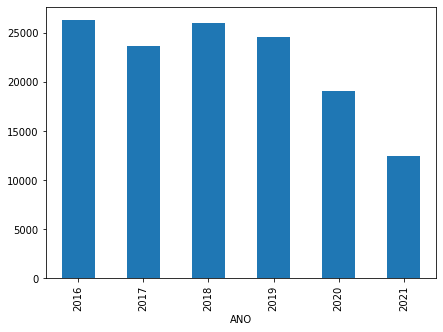

In [ ]:
df_copy.groupby(['ANO'])[['ones']].sum().plot(kind='bar', figsize= (7,5), legend=False)

In [ ]:
df_2021 = df_copy.query('(ANO == 2021)')

In [ ]:
df_2021

,LATITUD,LONGITUD,NOM_COMUNA,ANO,MES,DIA,DIA_SEMANA,CONDUCTA,CURSO_DE_VIDA,GENERO,ones
123355,-0.731173,711.093250,La Concordia,2021,ENERO,31,DOMINGO,HURTO A CELULARES,Jovenes,MASCULINO,1
123356,-0.731399,712.323617,Occidental,2021,ENERO,31,DOMINGO,HURTO A PERSONAS,Jovenes,MASCULINO,1
123357,-0.731222,712.447263,Oriental,2021,ENERO,31,DOMINGO,INDETERMINADA,Jovenes,MASCULINO,1
123358,-0.731222,712.447263,Oriental,2021,ENERO,31,DOMINGO,INDETERMINADA,Adultez,FEMENINO,1
123359,-0.730998,713.206298,Morrorico,2021,ENERO,31,DOMINGO,HURTO A RESIDENCIA,Adultez,MASCULINO,1
...,...,...,...,...,...,...,...,...,...,...,...
260078,7.098448,-73.107469,Lagos del Cacique,2021,JULIO,22,JUEVES,MECHERO/HORMIGUEO,No Reporta,NO REPORTA,1
260079,7.129577,-73.124657,San Francisco,2021,JULIO,27,MARTES,MECHERO/HORMIGUEO,No Reporta,NO REPORTA,1
260080,7.123443,-73.116917,Oriental,2021,JULIO,28,MIÉRCOLES,SUPL. SERVICIOS TECNICOS,No Reporta,NO REPORTA,1
260081,7.134730,-73.109529,Oriental,2021,JULIO,9,VIERNES,HALADO,Adultez,MASCULINO,1


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f7f23000e50>],
      dtype=object)

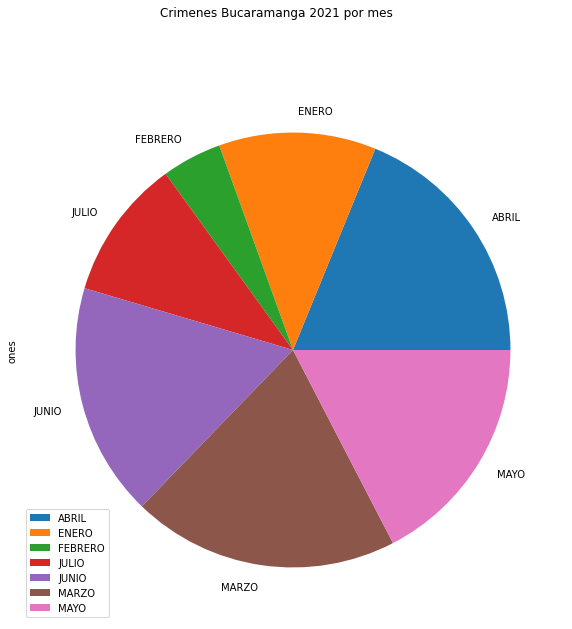

In [ ]:
df_2021.groupby(['MES'])[['ones']].count().plot(kind='pie', subplots=True, figsize=(18,10), title='Crimenes Bucaramanga 2021 por mes')

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f7f126f7bd0>],
      dtype=object)

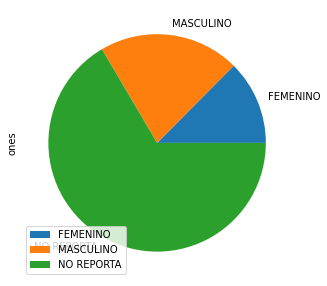

In [ ]:
df_2021.groupby(['GENERO'])[['ones']].count().plot(kind='pie', subplots=True, figsize=(8,5))

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
tab=pd.crosstab(index=df_copy['MES'], columns='Frecuencia')
tab

col_0,Frecuencia
MES,
ABRIL,11244
AGOSTO,9380
DICIEMBRE,12320
ENERO,12238
FEBRERO,11106
JULIO,10863
JUNIO,11386
MARZO,11470
MAYO,11682


In [ ]:
df_copy['MES'].unique()
[{'ENERO': 1,
 'FEBRERO': 2,
 'MARZO': 3,
 'ABRIL': 4,
 'MAYO': 5,
 'JUNIO': 6,
 'JULIO': 7,
 'AGOSTO': 8,
 'SEPTIEMBRE': 9,
 'OCTUBRE': 10,
 'NOVIEMBRE': 11,
 'DICIEMBRE': 12
 }]

[{'ABRIL': 4,
  'AGOSTO': 8,
  'DICIEMBRE': 12,
  'ENERO': 1,
  'FEBRERO': 2,
  'JULIO': 7,
  'JUNIO': 6,
  'MARZO': 3,
  'MAYO': 5,
  'NOVIEMBRE': 11,
  'OCTUBRE': 10,
  'SEPTIEMBRE': 9}]

<BarContainer object of 12 artists>

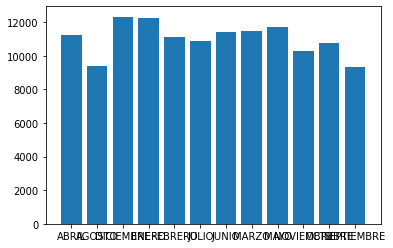

In [ ]:
plt.bar(tab.index, tab['Frecuencia'])

# Arreglo Latitud y Longitud

In [ ]:
df = df_del.loc[:,['LATITUD','LONGITUD']]

In [ ]:
df['LATITUD'].sample(5)

130801    7,119,290,309
64112      7.1387688840
73570      7.1453731770
183010    7,151,111,072
3387       7.1513592700
Name: LATITUD, dtype: object

In [ ]:
df['LATITUD'].astype(str)

0               7.170557382
1         7.120645357999999
2         7.120645357999999
3                7.15135927
4               7.170557382
                ...        
260078          7.098447531
260079          7.129577142
260080           7.12344346
260081          7.134729719
260082          7.103833741
Name: LATITUD, Length: 260083, dtype: object

In [ ]:
df['LATITUD'] = df['LATITUD'].apply(lambda x: str(x))
df['LONGITUD'] = df['LONGITUD'].apply(lambda x: str(x))

In [ ]:
type(df['LONGITUD'][2])

str

In [ ]:
df['LONGITUD'][104405]

'-7.31182E+11'

In [ ]:
df_new = df.copy(deep=True)

In [ ]:
df_new['LATITUD'].str.contains('nan')

8252

In [ ]:
index_nan =df_new[df_new['LATITUD'].str.contains('nan')].index.tolist()

In [ ]:
df_new=df_new.drop(index=index_nan)

In [ ]:
df_new['LATITUD'] = df_new['LATITUD'].str.replace(',','')
df_new['LATITUD'] = df_new['LATITUD'].str.replace('.','')
df_new['LONGITUD'] = df_new['LONGITUD'].str.replace(',','')
df_new['LONGITUD'] = df_new['LONGITUD'].str.replace('.','')



In [ ]:
df_new.sample(10)

,LATITUD,LONGITUD
234863,7151456409,-7313053135
185255,7116725204,-7312315813
142747,7170421382,-731312554
170731,7100384865,-7312960143
124780,7137422298,-7310646581
51138,7176094526,-7313169984
52661,71208047510000005,-7312576416
139721,7120001072,-7311608426
74038,7098667887,-7310715633
8121,71615597189999995,-7313891906


In [ ]:
df_new['LONGITUD']= df_new['LONGITUD'].str[:3]+'.'+df_new['LONGITUD'].str[3::]
df_new['LATITUD']=df_new['LATITUD'].str[:1]+'.'+df_new['LATITUD'].str[1::]

In [ ]:
df_new['LATITUD'] = df_new['LATITUD'].apply(lambda x: float(x))
df_new['LONGITUD'] = df_new['LONGITUD'].apply(lambda x: float(x))

In [ ]:
pd.options.display.float_format='{:.5f}'.format

In [ ]:
pd.reset_option('^display')

In [ ]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 251831 entries, 0 to 260082
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   LATITUD   251831 non-null  float64
 1   LONGITUD  251831 non-null  float64
dtypes: float64(2)
memory usage: 5.8 MB


In [ ]:
import plotly.express as px
token_map_plot='pk.eyJ1IjoiZGllZ281MWFsZWpvIiwiYSI6ImNrd3Rid2xtOTFmM2kybnM2bWczeWdobTUifQ.sZrX27F8jDgXL_eUYA6SVw'
px.set_mapbox_access_token(token_map_plot)

In [ ]:
px.scatter_mapbox(df_new,lat='LATITUD', lon='LONGITUD', color='LATITUD', color_continuous_scale=px.colors.cyclical.IceFire,size_max=15,zoom=10)